# DTSA 5509 - Intro to ML: Supervised Learning - Final Project
---
## Contents
1. Introduction and overview of the problem
2. Description of the data source
3. Data cleaning
4. Exploratory data analysis
5. Modeling
6. Results and analysis
7. Discussion and conclusion
---

In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import numpy as np
import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
pp = pprint.PrettyPrinter()

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve
from xgboost import XGBClassifier, plot_importance

---
## 1. Introduction and overview of the problem
The goal of this project is to apply machine learning techniques to a set of bank customer data in order to predict whether the customer will stay with the bank or will take their business elsewhere. 

We will train Logistic Regression, K-Nearest Neighbors, AdaBoost and XGBoost models with default parameters to establish a baseline classification performance, then we will tune the XGBoost model to see how much improvement we can achieve.

This is a binary classification task. We will use the given features to predict whether or not a customer churned.

Predicting customer churn is very important to companies in service industries or who have a subscription-based pricing model with a recurring revenue stream. Knowing which of your customers are likely to leave allows you to optimally target them with discounts, sales calls or other incentives to stay.

---

## 2. Description of the data source

The data for this project is part of a Kaggle public data set title "Bank Customer Churn Prediction".

Citation: Kaggle. (no date) *Bank Customer Churn Prediction*. Retrieved January 28, 2024 from
    
        https://www.kaggle.com/datasets/shubhammeshram579/bank-customer-churn-prediction/data

It contains data on bank customers, one row per customer. There are 10,002 rows and 14 columns in the data set. At first glance, some features in the data set that might be useful for predicting churn are the length of time the customer has been with the bank (tenure) and how many of the bank's products a customer uses (NumOfProducts). This last feature represents how engaged the customer is with the bank and could be a proxy for the importance of the bank's services in the customer's life.

The data set seems to be fairly clean already. On cursory examination, the data is densely populated with no large swaths of missing data.

---

## 3. Data cleaning

In this section we will dig deeper into the data and perform some clean up. We'll look at the shape, data types and descriptive stats.

**Duplicates** - CustomerId is supposed to be a unique identifier for customer, but looking at unique counts, there are two customer ids with a count of 2. Looking more closely, every column of the pair of duplicates is the same, so we will not lose any information by simply dropping the two duplicates. This brings our record count from 10,002 to 10,000

**Missing data** - There are 4 features that each have one missing value. These appear on 4 separate records. Since the amount of missing data is low (4 out of 10,000) and there is no obvious way to impute the missing data, we will simply drop the 4 records that have any missing data. This bring our record count to 9996.

**Data types** - Pandas does a good job guessing at data types, but I made the following adjustments:

- `CustomerID` is numerical and was loaded as an int, but it has no numerical meaning. ie: customer 100 is not larger in any meaningful way than customer 50. I will probably end up dropping this feature, but for now, I will cast it to string.
- `Age` was loaded as float, but there are no fractional ages, so I will cast it to int.
- `HasCrCard`, `IsActiveMember` and `Exited` are booleans that are coded as 0/1. They were loaded by Pandas as int, but I cast them to boolean to help with visualizations and modeling later on.

In [2]:
df = pd.read_csv('Churn_Modelling.csv')
df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42.0,2,0.00,1,1.0,1.0,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41.0,1,83807.86,1,0.0,1.0,112542.58,0
2,3,15619304,Onio,502,France,Female,42.0,8,159660.80,3,1.0,0.0,113931.57,1
3,4,15701354,Boni,699,France,Female,39.0,1,0.00,2,0.0,0.0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43.0,2,125510.82,1,NaN,1.0,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9997,9998,15584532,Liu,709,France,Female,36.0,7,0.00,1,0.0,1.0,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42.0,3,75075.31,2,1.0,0.0,92888.52,1
9999,9999,15682355,Sabbatini,772,Germany,Male,42.0,3,75075.31,2,1.0,0.0,92888.52,1
10000,10000,15628319,Walker,792,France,Female,28.0,4,130142.79,1,1.0,0.0,38190.78,0


In [3]:
df.shape

(10002, 14)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10002 entries, 0 to 10001
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10002 non-null  int64  
 1   CustomerId       10002 non-null  int64  
 2   Surname          10002 non-null  object 
 3   CreditScore      10002 non-null  int64  
 4   Geography        10001 non-null  object 
 5   Gender           10002 non-null  object 
 6   Age              10001 non-null  float64
 7   Tenure           10002 non-null  int64  
 8   Balance          10002 non-null  float64
 9   NumOfProducts    10002 non-null  int64  
 10  HasCrCard        10001 non-null  float64
 11  IsActiveMember   10001 non-null  float64
 12  EstimatedSalary  10002 non-null  float64
 13  Exited           10002 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 1.1+ MB


In [5]:
df.describe(include='all')

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10002.000000,1.000200e+04,10002,10002.000000,10001,10002,10001.000000,10002.000000,10002.000000,10002.000000,10001.000000,10001.000000,10002.000000,10002.000000
unique,NaN,NaN,2932,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Smith,NaN,France,Male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,32,NaN,5014,5458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,5001.499600,1.569093e+07,NaN,650.555089,NaN,NaN,38.922311,5.012498,76491.112875,1.530194,0.705529,0.514949,100083.331145,0.203759
std,2887.472338,7.193177e+04,NaN,96.661615,NaN,NaN,10.487200,2.891973,62393.474144,0.581639,0.455827,0.499801,57508.117802,0.402812
min,1.000000,1.556570e+07,NaN,350.000000,NaN,NaN,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,2501.250000,1.562852e+07,NaN,584.000000,NaN,NaN,32.000000,3.000000,0.000000,1.000000,0.000000,0.000000,50983.750000,0.000000
50%,5001.500000,1.569073e+07,NaN,652.000000,NaN,NaN,37.000000,5.000000,97198.540000,1.000000,1.000000,1.000000,100185.240000,0.000000
75%,7501.750000,1.575323e+07,NaN,718.000000,NaN,NaN,44.000000,7.000000,127647.840000,2.000000,1.000000,1.000000,149383.652500,0.000000


In [6]:
df.nunique()

RowNumber          10000
CustomerId         10000
Surname             2932
CreditScore          460
Geography              3
Gender                 2
Age                   73
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [7]:
# Are there any duplicated CustomerId?
sum(df['CustomerId'].value_counts() > 1)

2

In [8]:
# There are two customers that are fully duplicated.
df[df.duplicated(subset='CustomerId', keep=False)]

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9998,9999,15682355,Sabbatini,772,Germany,Male,42.0,3,75075.31,2,1.0,0.0,92888.52,1
9999,9999,15682355,Sabbatini,772,Germany,Male,42.0,3,75075.31,2,1.0,0.0,92888.52,1
10000,10000,15628319,Walker,792,France,Female,28.0,4,130142.79,1,1.0,0.0,38190.78,0
10001,10000,15628319,Walker,792,France,Female,28.0,4,130142.79,1,1.0,0.0,38190.78,0


In [9]:
# Drop dups and re-check
df = df.drop_duplicates(subset='CustomerId', keep='first')
df[df.duplicated(subset='CustomerId', keep=False)]

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited


In [10]:
# Look at missing data counts across all the features
df.isna().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          1
Gender             0
Age                1
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          1
IsActiveMember     1
EstimatedSalary    0
Exited             0
dtype: int64

In [11]:
# Closer look at the missing data
df[df.isna().any(axis=1)]

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
4,5,15737888,Mitchell,850,Spain,Female,43.0,2,125510.82,1,NaN,1.0,79084.10,0
6,7,15592531,Bartlett,822,NaN,Male,50.0,7,0.00,2,1.0,1.0,10062.80,0
8,9,15792365,He,501,France,Male,44.0,4,142051.07,2,0.0,NaN,74940.50,0
9,10,15592389,H?,684,France,Male,NaN,2,134603.88,1,1.0,1.0,71725.73,0


In [12]:
# There are 4 customers with some missing data. This is a small percentage, so we will drop them.
df = df.dropna()
df[df.isna().any(axis=1)]

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited


In [13]:
# Remaining data
df.shape

(9996, 14)

In [14]:
# Data type conversions
# CustomerId looks like a number, but it has no significance as a number.
df['CustomerId'] = df['CustomerId'].astype(str)
df['Age'] = df['Age'].astype(int)
df['HasCrCard'] = df['HasCrCard'].astype(bool)
df['IsActiveMember'] = df['IsActiveMember'].astype(bool)
df['Exited'] = df['Exited'].astype(bool)

In [15]:
df.dtypes

RowNumber            int64
CustomerId          object
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard             bool
IsActiveMember        bool
EstimatedSalary    float64
Exited                bool
dtype: object

In [16]:
# Final look at the df after cleaning
df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,True,True,101348.88,True
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,False,True,112542.58,False
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,True,False,113931.57,True
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,False,False,93826.63,False
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,True,False,149756.71,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,True,False,96270.64,False
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,True,True,101699.77,False
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,False,True,42085.58,True
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,True,False,92888.52,True


---
## 4. Exploratory Data Analysis

In this section we will perform EDA to get a better feel for the shape of the data and the relationship between features.

The first pairplot is done before one-hot encoding. It shows the distribution of the numerical features in the data set and the relationship between those feature. I've used the color dimension to represent the target variable so we can visually see if the two classes are visibly separable in 1D or 2D. Unfortunately, the histograms on the diagonal of the pairplot shows that none of the single features allows a clean separation of the two classes. 

The story told by the rest of the pairplot in the pairwise scatterplots is better, but not great. Even in 2D, the churners and non-churners overlap almost completely. The one piece of good news is that the churners do tend to form bands of observations in some of the pairplots. For example, Age vs Credit Score shows most of the churners in a narrow band of ages across many credit scores. Same with Age vs Estimate Salary. I expect Age will be a useful feature for the classifiers we will train later. I also expect NumOfProducts to be a strong predictor of churn since the pairplots seem to suggest more orange churners with 3 or 4 products than with 1 or 2.

Following the pairplot is a series of charts looking at the distribution of churners vs non-churner for various single features. Similar to the histograms in the pairplot, the charts suggest that there is not a lot of signal in the data. A few interesting observations:

- The target variable `Exited` displays strong class imbalance, with an 80/20 split between negative and positive cases.
- There are suprisingly many customers with credit scores in the 850-854 bucket. Not sure if this is realistic or an artifact of the way this data was collected.
- There are many customers with zero balance. This is not surprising and will hopefully provide a meaningful signal for the model to train on.
- There are some outliers in the Age and Balance feature. I will leave the outliers in Age alone since the range of values is not that big and we want to have representation of all ages. I will address the outliers in balance by using the RobustScaler.

This data set includes two categorical features, Geography and Gender. There are only three levels in Geography and I replaced the Gender feature with a single boolean feature (Male yes/no), so the net increase from one-hot encoding is only an extra two columns. No risk of falling victim to the curse of dimensionality.

Next up is a correlation plot. There is a strong area of negative correlation around the one-hot encoded Geography features (representing countries), but this was expected. There is moderate correlation between Age and our target variable Exited, which supports my belief that this will be an important feature to the model. There is also moderate correlation between Country_Germany and Balance, but not enough to necessitate dropping either feature.

The final chart is repeat of the pairplot after the one-hot encoding of the categorical features. The only notable thing here is that there is a higher proportion of churners in Germany compared to the two other countries.

In [17]:
# Drop columns that will not be useful for churn prediction
df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1, inplace=True)

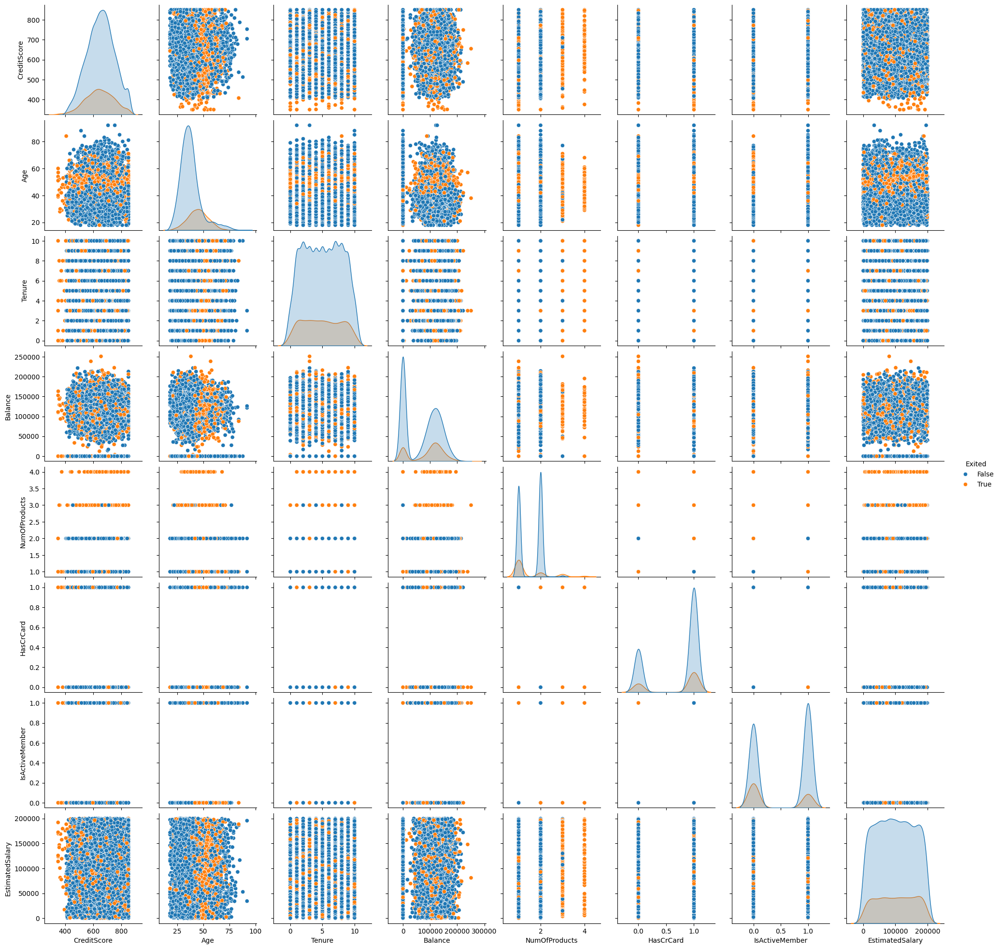

In [18]:
sns.pairplot(df, hue='Exited');

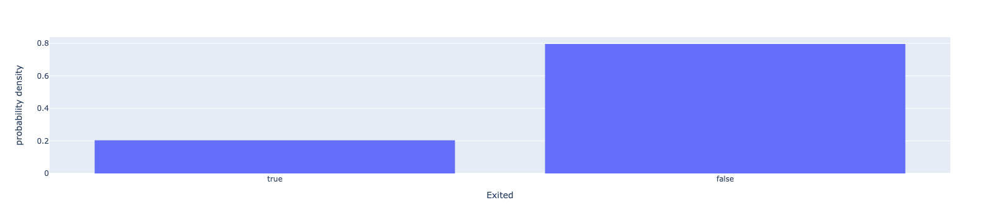

In [72]:
# Visualizations
fig = px.histogram(df, x='Exited', histnorm='probability density')
fig.show()

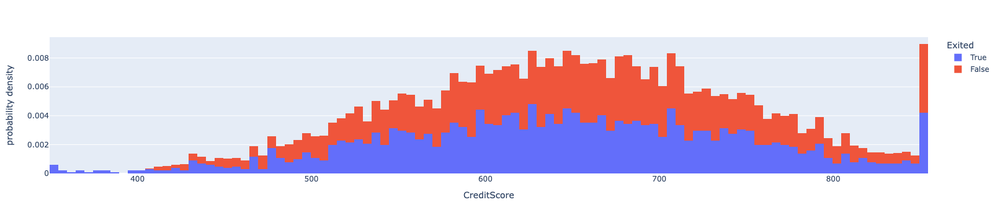

In [19]:
fig = px.histogram(df, x='CreditScore', color='Exited', histnorm='probability density')
fig.show()

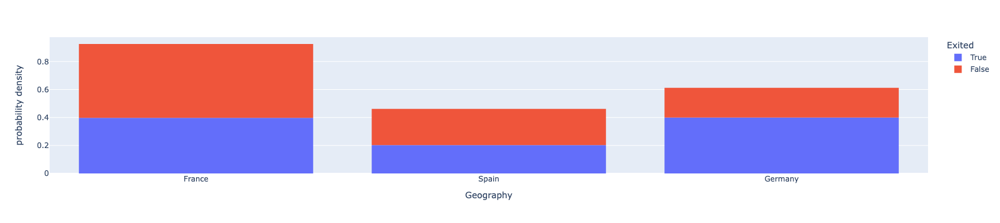

In [20]:
fig = px.histogram(df, x='Geography', color='Exited', histnorm='probability density')
fig.show()

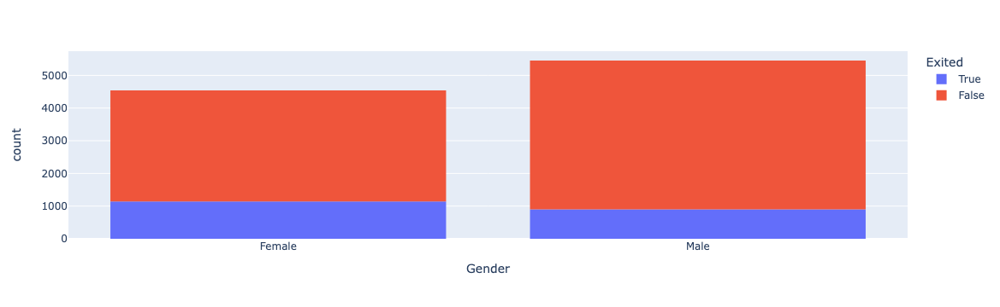

In [21]:
fig = px.histogram(df, x='Gender', color='Exited')
fig.show()

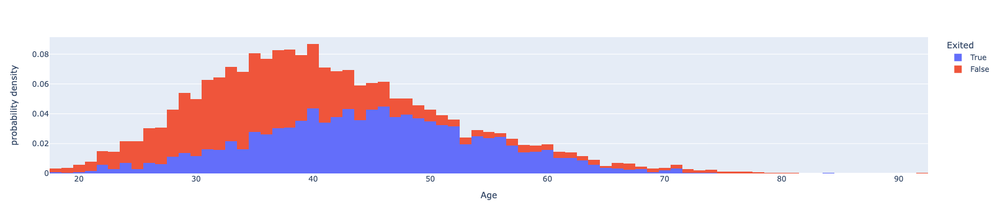

In [22]:
fig = px.histogram(df, x='Age', color='Exited', histnorm='probability density')
fig.show()

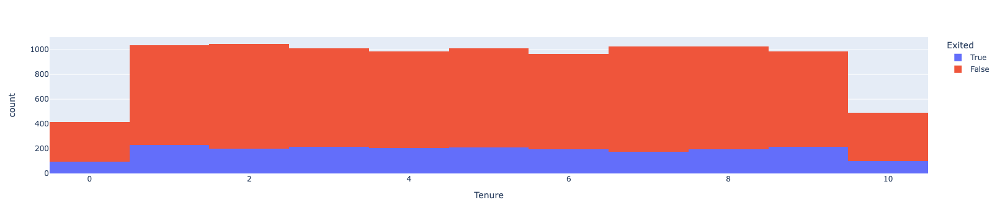

In [23]:
fig = px.histogram(df, x='Tenure', color='Exited')
fig.show()

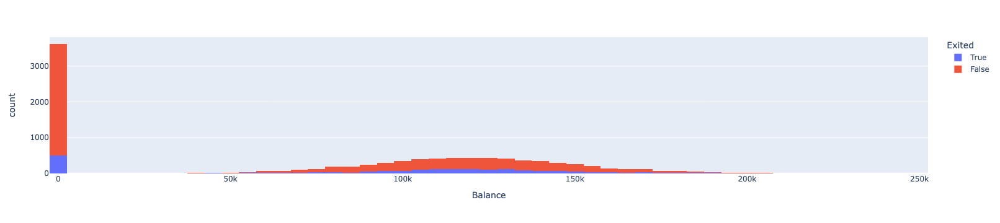

In [24]:
fig = px.histogram(df, x='Balance', color='Exited')
fig.show()

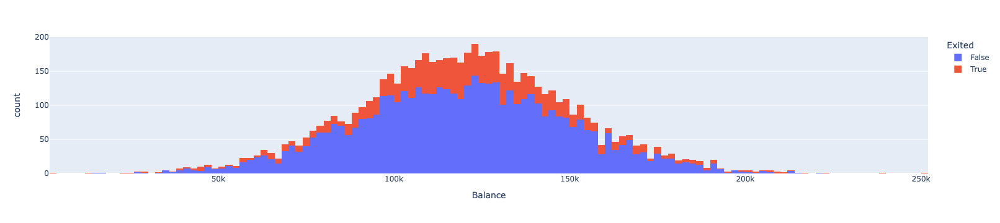

In [25]:
fig = px.histogram(df[df['Balance']>0], x='Balance', color='Exited')
fig.show()

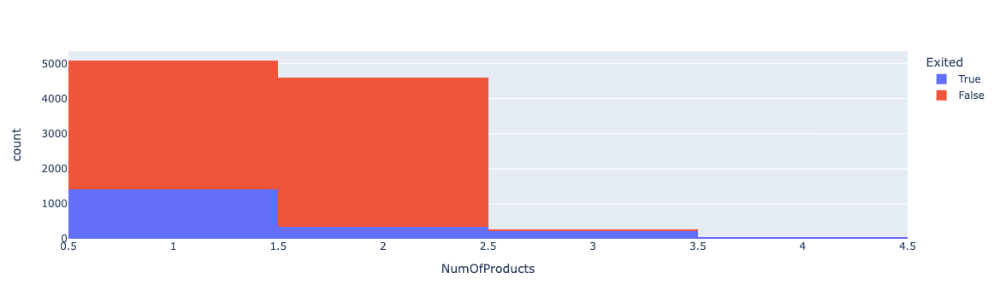

In [26]:
fig = px.histogram(df, x='NumOfProducts', color='Exited')
fig.show()

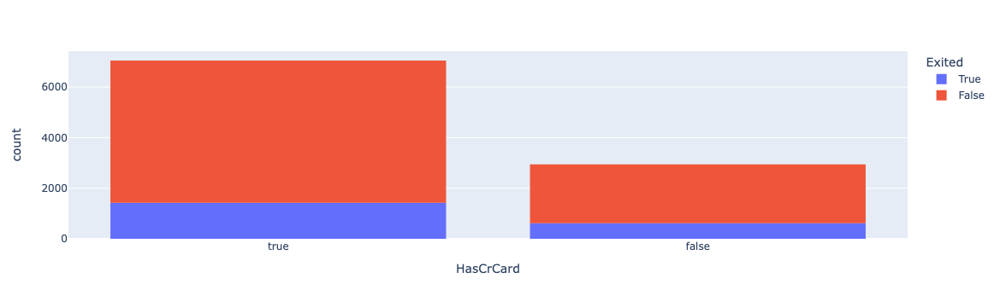

In [27]:
fig = px.histogram(df, x='HasCrCard', category_orders=dict(HasCrCard=[True, False]), color='Exited')
fig.show()

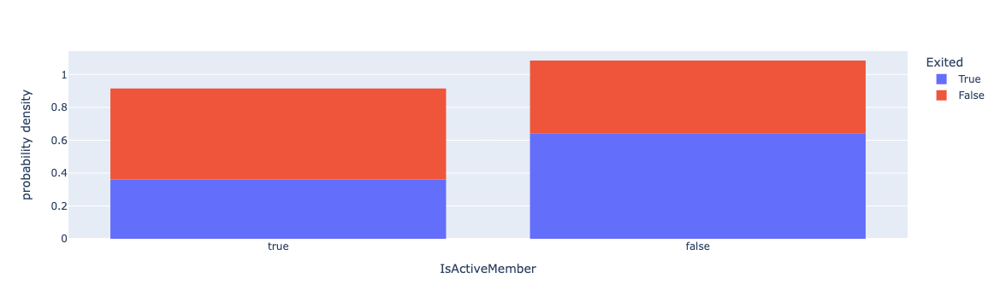

In [28]:
fig = px.histogram(df, x='IsActiveMember', category_orders=dict(HasCrCard=[True, False]), color='Exited', histnorm='probability density')
fig.show()

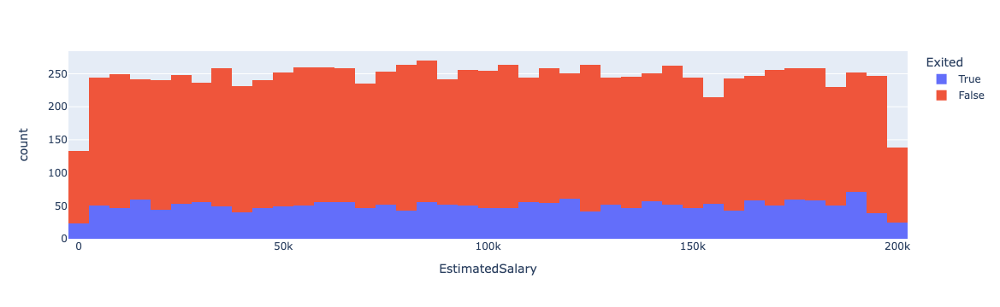

In [29]:
fig = px.histogram(df, x='EstimatedSalary', color='Exited')
fig.show()

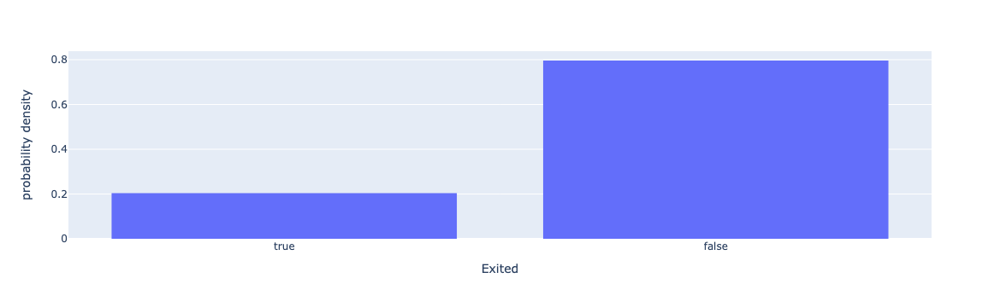

In [30]:
fig = px.histogram(df, x='Exited', category_orders=dict(HasCrCard=[True, False]), histnorm='probability density')
fig.show()

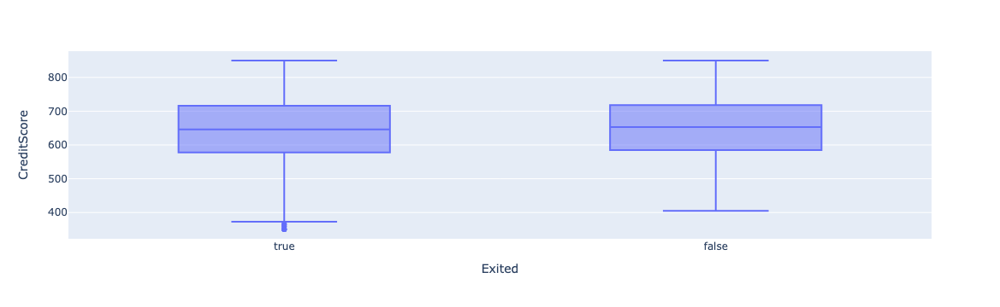

In [31]:
fig = px.box(df, x="Exited", y="CreditScore")
fig.show()

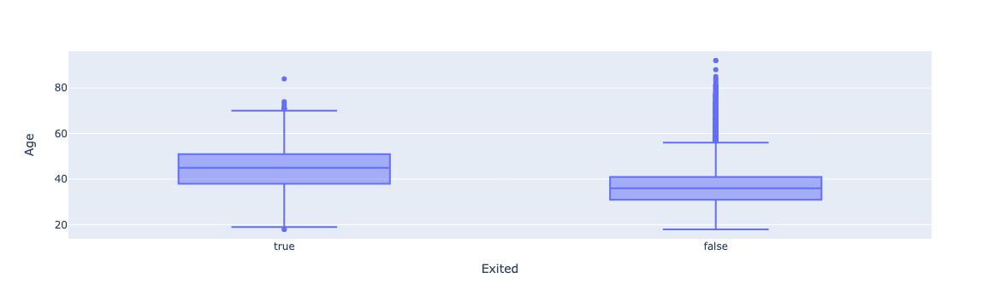

In [32]:
fig = px.box(df, x="Exited", y="Age")
fig.show()

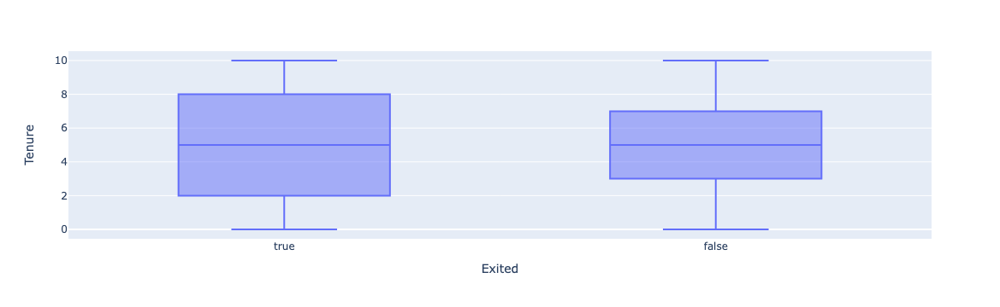

In [33]:
fig = px.box(df, x="Exited", y="Tenure")
fig.show()

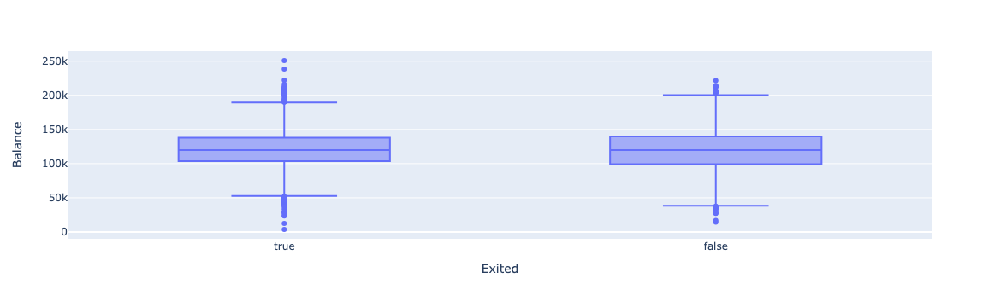

In [34]:
fig = px.box(df[df['Balance']>0].sort_values('Exited', ascending=False), x="Exited", y="Balance")
fig.show()

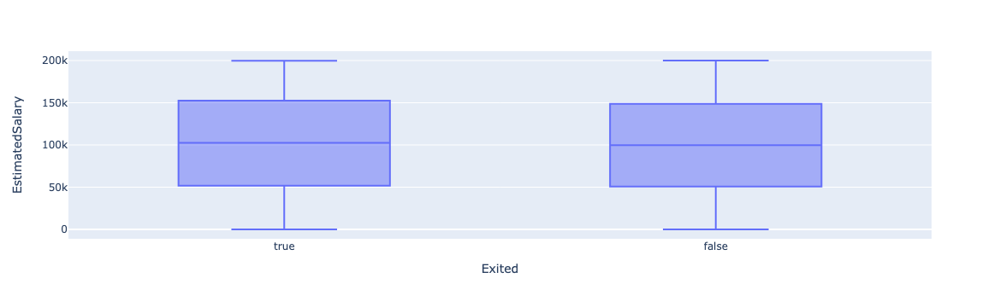

In [35]:
fig = px.box(df, x="Exited", y="EstimatedSalary")
fig.show()

In [36]:
# One-hot encode
df = pd.get_dummies(df, columns=['Geography'])
df = pd.get_dummies(df, columns=['Gender'], drop_first=True)
df

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Male
0,619,42,2,0.00,1,True,True,101348.88,True,True,False,False,False
1,608,41,1,83807.86,1,False,True,112542.58,False,False,False,True,False
2,502,42,8,159660.80,3,True,False,113931.57,True,True,False,False,False
3,699,39,1,0.00,2,False,False,93826.63,False,True,False,False,False
5,645,44,8,113755.78,2,True,False,149756.71,True,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,True,False,96270.64,False,True,False,False,True
9996,516,35,10,57369.61,1,True,True,101699.77,False,True,False,False,True
9997,709,36,7,0.00,1,False,True,42085.58,True,True,False,False,False
9998,772,42,3,75075.31,2,True,False,92888.52,True,False,True,False,True


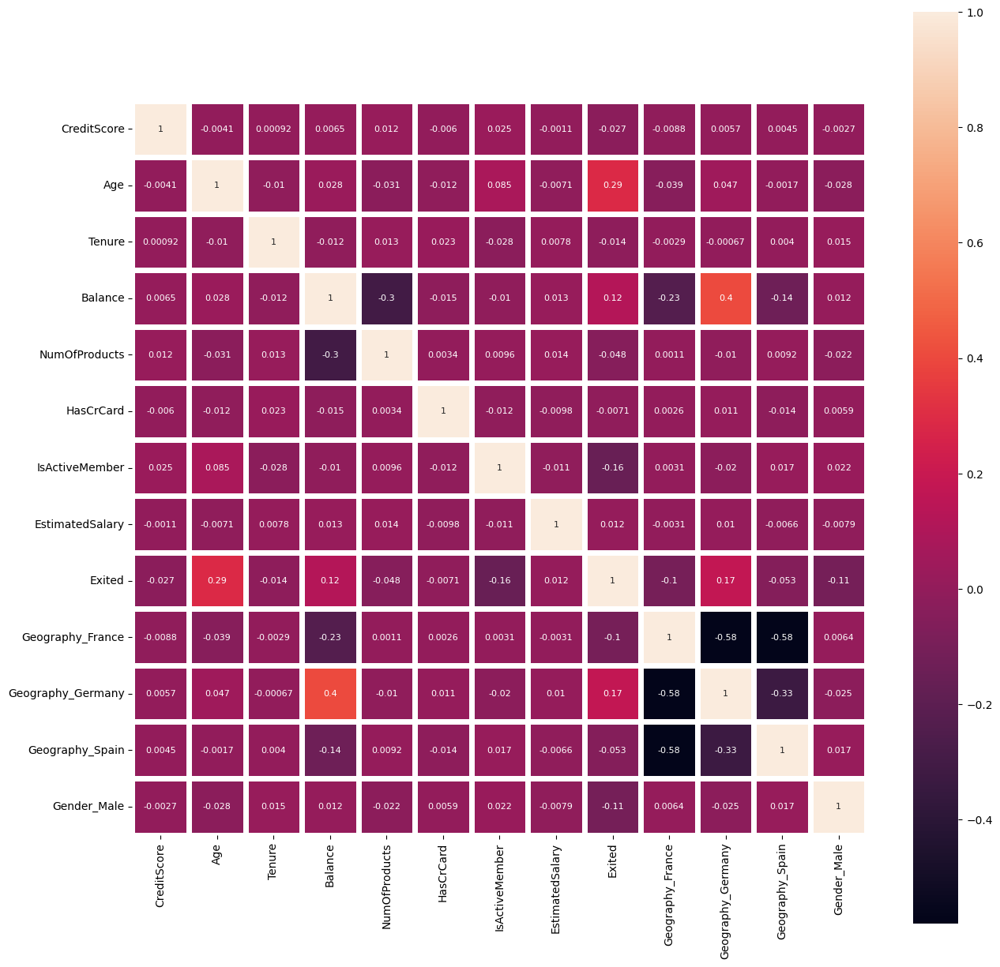

In [37]:
plt.figure(figsize=(15,15))
sns.heatmap(df.select_dtypes(['number', 'bool']).corr(),linewidths=5, annot=True, square=True, annot_kws={'size': 8});

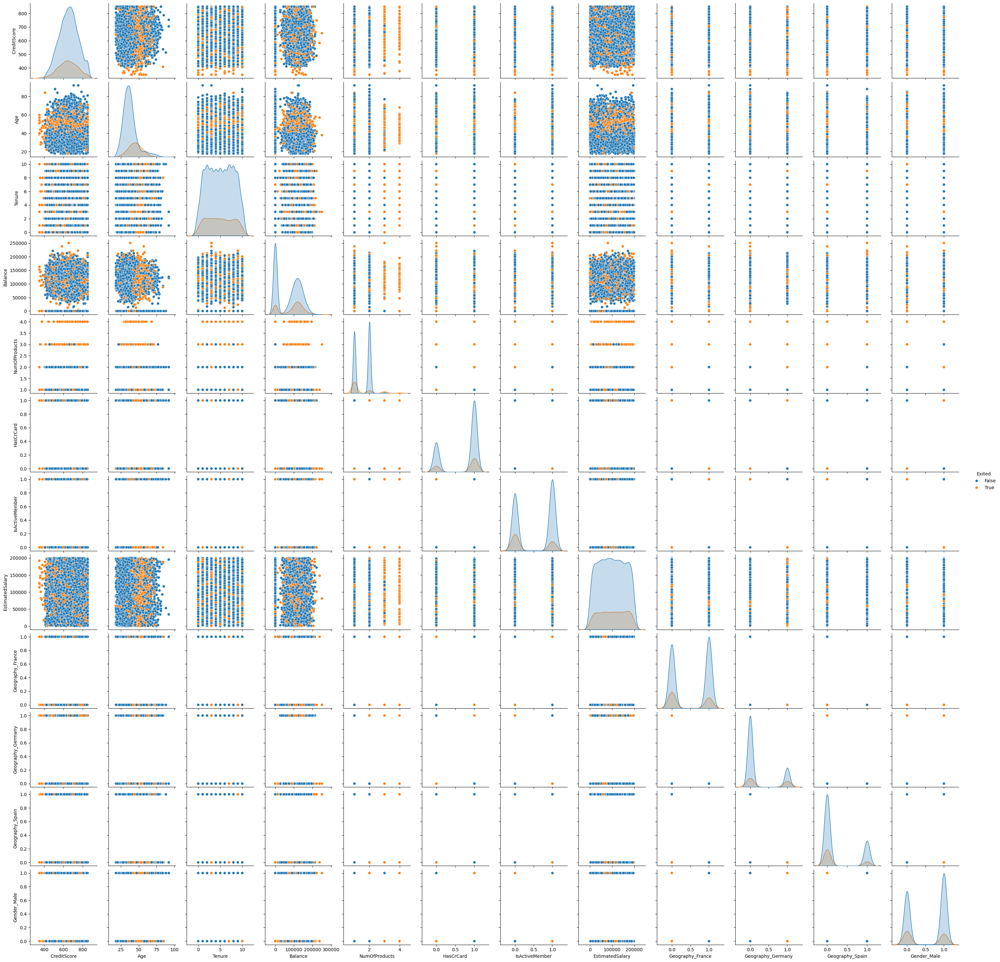

In [38]:
sns.pairplot(df, hue='Exited');

---
## 5. Modeling

In this section I will do the last few steps of feature engineering, then fit Logistic Regression, KNN, Adaboost and XGBoost models with default params in order to establish a baseline. Then I will focus on improving the XGBoost model with RandomizedSearchCV for hyper-parameter tuning.

**Collinearity** - I did not address collinearity because my main focus is on XGBoost, which is a tree-based model and is inherently robust to multi-collinearity. Additionally, the correlation plot did not indicate that collinearity was a problem in this data set.

**Scaling** - The data in this data set has a wide range of units. Salary and Balance are on the order of 10^5 while NumOfProducts and Tenure are single-digit. To address this, we will rescale the data to a range of 0-1. For CreditScore, Age, Tenure and NumOfProducts, there were few outliers, so I used sklearn's MinMaxScaler. For Balance and EstimatedSalary, there were significant outliers, so I used RobustScaler, which is more robust to outliers.

**Class imbalance** - As noted above, this data set suffers from class imbalance. I addressed this in my model training function by applying SMOTE to the training data. It is important to only apply resampling to the training data and not the test data to avoid introducing artifacts into the test data that can lead to artificially inflated test scores. I also included an option to skip SMOTE so that I could compare results with and without class rebalancing. The results are quite significant and summarized below.

|                              | Without SMOTE | With SMOTE |
|------------------------------|---------------|------------|
|               Accuracy score | 0.81          | 0.72       |
| Correct positive predictions | 86            | 259        |
|                       Recall | 0.20          | 0.68       |
|                     F1 score | 0.36          | 0.50       |

&nbsp;

As we can see, the results are much better when using SMOTE. This serves as a good demonstration of the problem with relying on accuracy when modeling imbalanced data. The accuracy actually goes down when using SMOTE, but you have to remember that in this case, we care most about correctly identifying the positive cases. Looking at the results, the number of correctly identified positive cases rose from 86 to 259 when using SMOTE, which is a significant improvement. This is also reflected in the vastly improved recall and F1 scores.

**KFold CV** - My training function uses KFold cross validation with 5 folds and shuffling. I felt the shuffling was important in order to ensure the oversampled observations from SMOTE are not over-represented in any of the folds. 

**Multiple models** - The following classification models were fit to establish a baseline performance:
- Logistic regression
- KNN
- AdaBoost
- XGBoost

**Hyper-parameter tuning** - Once I established a baseline performance for the four model types, I performed hyper-parameter tuning on the XGBoost model. I used RandomizedSearchCV to test a random selection of parameters. Randomized search doesn't prune unpromising branches like some more advanced tuning packages, but it is more efficient than GridSearch since it is not exhaustive. My approach to choosing the set of parameters to search was to start with a range recommended on xgboost's site. I ran the RandomizedSearchCV and examined the resulting best parameters. If the best param was at the max value of one of the ranges, I assumed that the search may have preferred an even more extreme value if it was available and added another value to the list. I repeated this process until the F1 score stopped improving.

In [ ]:
### Rescale the features
minmax_scaler_cols = ['CreditScore', 'Age', 'Tenure', 'NumOfProducts']
minmax_scaler = MinMaxScaler()
df[minmax_scaler_cols] = minmax_scaler.fit_transform(df[minmax_scaler_cols])

robust_scaler_cols = ['Balance', 'EstimatedSalary']
robust_scaler = RobustScaler()
df[robust_scaler_cols] = robust_scaler.fit_transform(df[robust_scaler_cols])

In [40]:
df

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Male
0,0.538,0.324324,0.2,-0.761311,0.000000,True,True,0.011289,True,True,False,False,False
1,0.516,0.310811,0.1,-0.104712,0.000000,False,True,0.125048,False,False,False,True,False
2,0.304,0.324324,0.8,0.489563,0.666667,True,False,0.139164,True,True,False,False,False
3,0.698,0.283784,0.1,-0.761311,0.333333,False,False,-0.065159,False,True,False,False,False
5,0.590,0.351351,0.8,0.129917,0.333333,True,False,0.503248,True,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.842,0.283784,0.5,-0.761311,0.333333,True,False,-0.040321,False,True,False,False,True
9996,0.332,0.229730,1.0,-0.311845,0.000000,True,True,0.014855,False,True,False,False,True
9997,0.718,0.243243,0.7,-0.761311,0.000000,False,True,-0.590993,True,True,False,False,False
9998,0.844,0.324324,0.3,-0.173128,0.333333,True,False,-0.074692,True,False,True,False,True


In [41]:
# Split dependent and independent vars
X = df.drop(['Exited'], axis=1)
y = df[['Exited']]

In [63]:
def fit_and_score(clf, X, y, rebalance=True):
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    accuracy_scores = []
    recall_scores = []
    precision_scores = []
    f1_scores = []
    roc_auc_scores = []
    for i, (train_index, test_index) in enumerate(kf.split(X, y)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index]['Exited'], y.iloc[test_index]['Exited']
        if rebalance:
            smote = SMOTE()
            X_train, y_train = smote.fit_resample(X_train, y_train)
        
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
        recall_scores.append(recall_score(y_test, y_pred))
        precision_scores.append(precision_score(y_test, y_pred))
        f1_scores.append(f1_score(y_test, y_pred))
        roc_auc_scores.append(roc_auc_score(y_test, y_pred))
    
    print(f'Avg accuracy:  {np.mean(accuracy_scores)}')
    print(f'Avg recall:    {np.mean(recall_scores)}')
    print(f'Avg precision: {np.mean(precision_scores)}')
    print(f'Avg F1:        {np.mean(f1_scores)}')
    print(f'Avg ROC AUC:   {np.mean(roc_auc_scores)}')

    cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    disp.plot()
    plt.show()

Avg accuracy:  0.8115252126063032
Avg recall:    0.20425550547671945
Avg precision: 0.6124777445102292
Avg F1:        0.3062194747477454
Avg ROC AUC:   0.5856106369883237


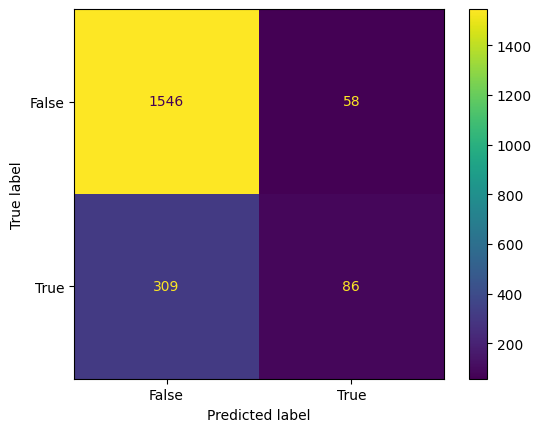

In [43]:
# LR model without SMOTE
model = LogisticRegression(penalty='l2', 
                           C=1, 
                           random_state=42, 
                           max_iter=100
                          )
fit_and_score(model, X, y, rebalance=False)

Avg accuracy:  0.7144856928464233
Avg recall:    0.6826199256905492
Avg precision: 0.38652553359411196
Avg F1:        0.49346287401325845
Avg ROC AUC:   0.702580631653029


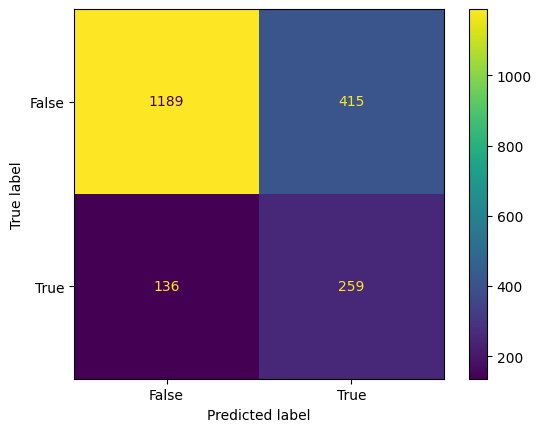

In [44]:
# LR with SMOTE
model = LogisticRegression(penalty='l2', 
                           C=1, 
                           random_state=42, 
                           max_iter=100
                          )
fit_and_score(model, X, y)

Avg accuracy:  0.7075806403201601
Avg recall:    0.6132732309330404
Avg precision: 0.3695819675719275
Avg F1:        0.4610526333074126
Avg ROC AUC:   0.6725141987640416


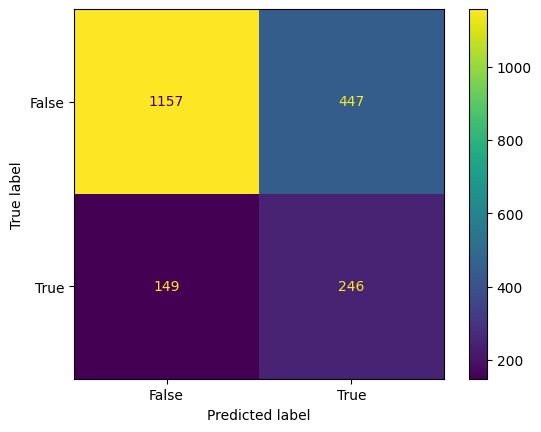

In [45]:
model = KNeighborsClassifier(n_neighbors=5)
fit_and_score(model, X, y)

Avg accuracy:  0.8052220610305152
Avg recall:    0.6765779887991403
Avg precision: 0.5168956525972256
Avg F1:        0.5857720662768039
Avg ROC AUC:   0.7573050494282076


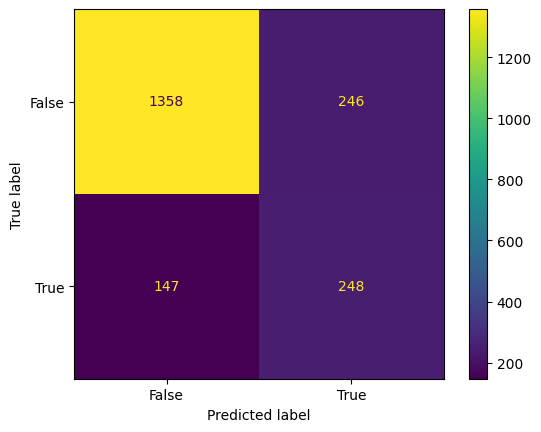

In [46]:
model = AdaBoostClassifier()
fit_and_score(model, X, y)

Avg accuracy:  0.8503403201600801
Avg recall:    0.5536700229830606
Avg precision: 0.6578229180230168
Avg F1:        0.600988442065832
Avg ROC AUC:   0.7399528762786984


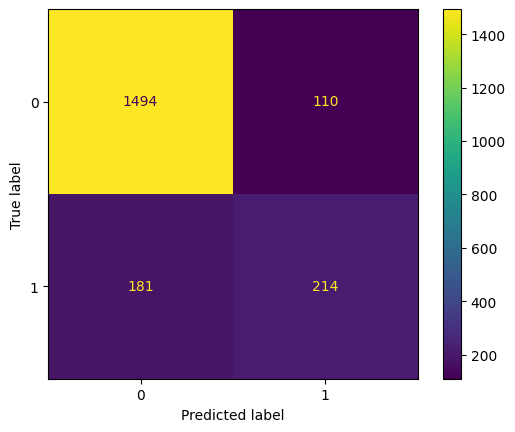

In [47]:
model = XGBClassifier()
fit_and_score(model, X, y)

### XGBoost Tuning

In [48]:
params = {'classifier__min_child_weight': [1, 5, 10, 15, 20],
          'classifier__gamma': [0.2, 0.5, 1, 1.5, 2, 5],
          'classifier__subsample': [0.2, 0.4, 0.6, 0.8, 1.0],
          'classifier__colsample_bytree': [0.2, 0.4, 0.6, 0.8, 1.0],
          'classifier__max_depth': [2, 4, 8, 15, 25],
          'classifier__learning_rate': [0.01, 0.02, 0.05, 0.1, 0.2],
          'classifier__n_estimators': [100, 200, 400, 600]
         }

In [49]:
xgb = XGBClassifier(objective='binary:logistic', 
                    nthread=1
                   )

In [50]:
pipeline = Pipeline([
    ('smote', SMOTE()),
    ('classifier', XGBClassifier())
])

In [64]:
folds = 5
skf = StratifiedKFold(n_splits=folds,
                      shuffle=True,
                      random_state=48
                     )

In [65]:
combinations = 100
random_cv = RandomizedSearchCV(estimator=pipeline,
                               param_distributions=params,
                               n_iter=combinations,
                               scoring='f1',
                               n_jobs=4,
                               cv=skf.split(X,y),
                               random_state=42
                              )

In [66]:
random_cv.fit(X, y)

RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x189eedf10>,
                   estimator=Pipeline(steps=[('smote', SMOTE()),
                                             ('classifier',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            feature_types=Non...
                   param_distributions={'classifier__colsample_bytree': [0.2,
                                                                         0.4,
                                                                         0.6,
                                                                         0.8,
                                                                         1.0],
                                        'classifier__gamma': [0.2, 0.5, 1, 1.5,
                                                              2, 5],
                                        'classifier__learning_rate': [0.01,
                                                                      0.02,
                                                                      0.05, 0.1,
                                                                      0.2],
                                        'classifier__max_depth': [2, 4, 8, 15,
                                                                  25],
                                        'classifier__min_child_weight': [1, 5,
                                                                         10, 15,
                                                                         20],
                                        'classifier__n_estimators': [100, 200,
                                                                     400, 600],
                                        'classifier__subsample': [0.2, 0.4, 0.6,
                                                                  0.8, 1.0]},
                   random_state=42, scoring='f1')

In [67]:
pp.pprint(random_cv.best_params_)
results = pd.DataFrame(random_cv.cv_results_)
results.sort_values('rank_test_score')

{'classifier__colsample_bytree': 0.6,
 'classifier__gamma': 1,
 'classifier__learning_rate': 0.02,
 'classifier__max_depth': 8,
 'classifier__min_child_weight': 15,
 'classifier__n_estimators': 400,
 'classifier__subsample': 0.8}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__subsample,param_classifier__n_estimators,param_classifier__min_child_weight,param_classifier__max_depth,param_classifier__learning_rate,param_classifier__gamma,param_classifier__colsample_bytree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
25,0.766686,0.009795,0.025999,0.001315,0.8,400,15,8,0.02,1,0.6,"{'classifier__subsample': 0.8, 'classifier__n_...",0.643038,0.609032,0.643564,0.636132,0.623574,0.631068,0.013167,1
73,0.834141,0.047686,0.026926,0.001851,1.0,400,15,8,0.02,2,0.6,"{'classifier__subsample': 1.0, 'classifier__n_...",0.639697,0.606684,0.636132,0.635561,0.615990,0.626813,0.013051,2
58,1.194926,0.056558,0.035783,0.000545,0.6,600,20,15,0.01,2,0.6,"{'classifier__subsample': 0.6, 'classifier__n_...",0.640100,0.610909,0.620359,0.634686,0.624235,0.626058,0.010362,3
54,0.759969,0.030945,0.021644,0.001006,0.6,600,20,4,0.02,1,1.0,"{'classifier__subsample': 0.6, 'classifier__n_...",0.630675,0.620192,0.621908,0.634615,0.619617,0.625402,0.006091,4
5,0.270271,0.008987,0.014125,0.000541,0.4,400,5,4,0.1,5,0.6,"{'classifier__subsample': 0.4, 'classifier__n_...",0.620776,0.615776,0.618454,0.636927,0.631056,0.624598,0.008048,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,0.251768,0.012485,0.014688,0.000596,0.8,200,15,2,0.01,0.5,0.2,"{'classifier__subsample': 0.8, 'classifier__n_...",0.570850,0.582661,0.575150,0.576687,0.570000,0.575070,0.004555,96
69,0.162239,0.009184,0.014232,0.000319,1.0,100,10,2,0.02,1.5,0.6,"{'classifier__subsample': 1.0, 'classifier__n_...",0.575192,0.560606,0.568548,0.582043,0.574619,0.572202,0.007203,97
16,0.676247,0.011207,0.026139,0.000558,0.4,400,1,15,0.01,1,0.2,"{'classifier__subsample': 0.4, 'classifier__n_...",0.569343,0.540382,0.581498,0.569733,0.586510,0.569493,0.016008,98
26,0.975277,0.024964,0.030182,0.001257,0.2,600,5,25,0.2,1,1.0,"{'classifier__subsample': 0.2, 'classifier__n_...",0.571785,0.551637,0.572840,0.575875,0.550943,0.564616,0.010965,99


---
## 6. Results and analysis

**Training the final model** - The RandomizedSearchCV fits the XGBoost model with 100 combinations of the hyper-parameters and returns the best params. I then take those params and train a final XGBoost model using those params within the same pipeline used to train the baseline models.

**Performance metrics** - I calculated the following metrics for each model: accuracy, precision, recall, F1 and ROC AUC. As discussed above, accuracy is not a reliable metric for imbalanced data sets and is only included for comparison to the other metrics. Precision and recall are both reliable metrics for imbalanced data sets. A safe assumption in this use case is that we are more interested in finding the positive cases (the cost of a false negative is higher than the cost of a false positive), in which case recall would be the metric of choice. In the end, I used F1, which provides a balance between precision and recall. 

Evaluation metrics for the 5 models are shown below:

|           | LR   | KNN  | AdaBoost | XGBoost | Tuned XGB     |
|-----------|------|------|----------|---------|---------------|
| Accuracy  | 0.71 | 0.71 | 0.81     | 0.85    | 0.85          |
| Recall    | 0.68 | 0.61 | 0.68     | 0.53    | 0.60          |
| Precision | 0.39 | 0.37 | 0.52     | 0.66    | 0.65          |
| F1 score  | 0.49 | 0.46 | 0.59     | 0.60    | **0.62**      |
| ROC AUC   | 0.70 | 0.67 | 0.76     | 0.74    | 0.76          |

&nbsp;

As we can see, the Tuned XGB model shows modest improvement over the untuned XGB model.

I also produce a confusion matrix which provides more insight into correct classifications and Type I vs Type II errors. Correct false predictions (upper left corner of the confusion matrix) are the majority class and are assumed to be easy to get right. The real focus is on the number in the lower right corner: the correct positive predictions. We can also look at the balance between false negatives (lower left) and false positives (upper right).

Overall, I feel the Tuned XGB model performs well, with a good F1 score and a good balance between Type I and Type II errors.

**Feature Importance** - The feature importance chart shows that Age and Tenure are the two features the model thinks are most useful in making splits in the data. Age being the most important aligns with my analsys of the pairplot chart. Tenure was a bit surprising since it doesn't show clear separation of the positive and negative classes in the pairplot chart. CreditScore was only 5th in the list, which was surprising based on the pairplots. 

From a qualitative standpoint, my inutuition was that the number of products a customer uses would create stickiness and would reduce churn propensity. The feature importance chart, however, shows that the NumProducts feature is actually not that important to the model, which is surprising.

Avg accuracy:  0.8521408204102052
Avg recall:    0.5957209421231592
Avg precision: 0.6492900690141777
Avg F1:        0.6212957132137432
Avg ROC AUC:   0.7567114686080679


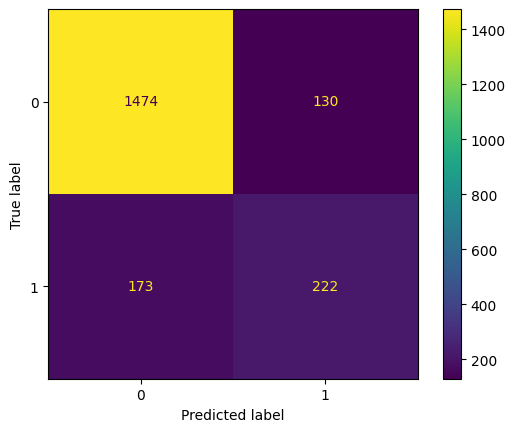

In [70]:
model = XGBClassifier(subsample=random_cv.best_params_['classifier__subsample'],
                      min_child_weight=random_cv.best_params_['classifier__min_child_weight'],
                      max_depth=random_cv.best_params_['classifier__max_depth'],
                      gamma=random_cv.best_params_['classifier__gamma'],
                      colsample_bytree=random_cv.best_params_['classifier__colsample_bytree'],
                      learning_rate=random_cv.best_params_['classifier__learning_rate'],
                      n_estimators=random_cv.best_params_['classifier__n_estimators'])
fit_and_score(model, X, y)

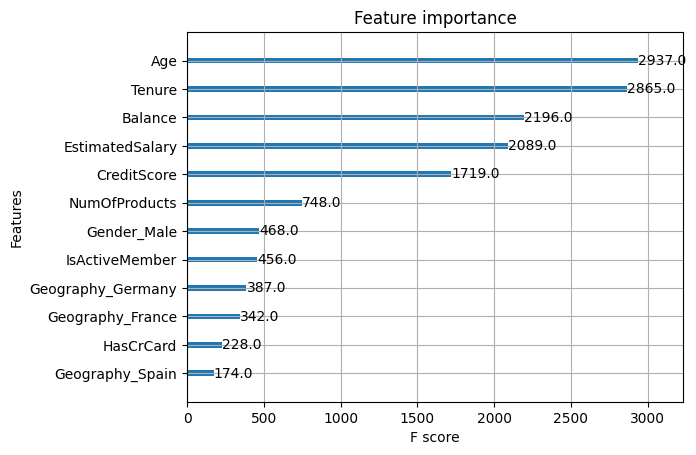

In [71]:
plot_importance(model);

---
## 7. Discussion and Conclusion

The first thing that stood out to me during this project was the difference in feature importance between my intuition, the insights provided by the EDA, and the model's feature importance chart. For example, I would expect that IsActiveMember would be a good predictor of churn, but it ends up not being important at all (8th of 14 features in feature importance chart). On the other hand, based purely on intuition I would not expect age to make a big difference in churn rates, but both the pairplot analysis and the model feature importance chart show that it is extremely important.

The next interesting learning is that using SMOTE to address class imbalance can make a huge difference in model performance. I knew of the importance of over/under-sampling and how SMOTE works, but I was surprised to see such a large improvement in metrics.

One surprising thing that didn't work, or at least didn't work as well as I thought it would was hyper-parameter tuning. The F1 score of the XGBoost model improved from 0.60 to 0.62, which is not insignificant, but is smaller than I expected. I suppose this supports the idea that modeling is only one part of data science and that the impact of feature engineering must not be overlooked.

For future improvements, since hyper-parameter tuning seems to give only marginal improvement, my next step would be to go back to data cleaning and feature engineering. For example, there were outliers in the Age and Balance features that I left in because I thought there was useful information there. The models may perform better if those outliers were removed from the training set. There were also some features that were bimodal. For example, there were a large number of customers with high credit scores (>850) or with zero balance. I would try splitting these observations off into their own model.

Another future improvement would be to explore the use of other hyper-parameter tuning approaches. GridSearch and RandomSearch work but are not "intelligent" in their selection of parameters to try. Hyper-parameter tuning packages like Optuna or Hyperopt implement better algorithms for selecting the next set of hyper-params and pruning unpromising branches early on. This allows efficiently searching a larger parameter space.